In [1]:
import pandas as pd
import numpy as np
import matplotlib as plot

%matplotlib inline

In [2]:
cd ..

/Users/mingmingguo


In [3]:
cd Documents

/Users/mingmingguo/Documents


In [4]:
data = pd.read_csv('market_train.csv')
data.head()

/Users/mingmingguo/anaconda/lib/python2.7/site-packages/pandas/io/parsers.py:1170: DtypeWarning: Columns (8,9,10,11,12,43,157,196,214,225,228,229,231,235,238) have mixed types. Specify dtype option on import or set low_memory=False.
  data = self._reader.read(nrows)


,ID,VAR_0001,VAR_0002,VAR_0003,VAR_0004,VAR_0005,VAR_0006,VAR_0007,VAR_0008,VAR_0009,...,VAR_1926,VAR_1927,VAR_1928,VAR_1929,VAR_1930,VAR_1931,VAR_1932,VAR_1933,VAR_1934,target
0,2,H,224,0,4300,C,0,0,False,False,...,98,98,998,999999998,998,998,9998,9998,IAPS,0
1,4,H,7,53,4448,B,1,0,False,False,...,98,98,998,999999998,998,998,9998,9998,IAPS,0
2,5,H,116,3,3464,C,0,0,False,False,...,98,98,998,999999998,998,998,9998,9998,IAPS,0
3,7,H,240,300,3200,C,0,0,False,False,...,98,98,998,999999998,998,998,9998,9998,RCC,0
4,8,R,72,261,2000,N,0,0,False,False,...,98,98,998,999999998,998,998,9998,9998,BRANCH,1


In [5]:
# Random Select part of data set due to the memory limit
random_data = data.sample(50000)
random_data.head()

,ID,VAR_0001,VAR_0002,VAR_0003,VAR_0004,VAR_0005,VAR_0006,VAR_0007,VAR_0008,VAR_0009,...,VAR_1926,VAR_1927,VAR_1928,VAR_1929,VAR_1930,VAR_1931,VAR_1932,VAR_1933,VAR_1934,target
75322,150866,H,148,109,2678,B,0,0,False,False,...,98,98,998,999999998,998,998,9998,9998,BRANCH,0
20867,41457,R,36,17,2177,C,0,0,False,False,...,0,1,0,999999996,400,400,9996,66,IAPS,0
21240,42203,H,57,0,0,N,0,0,False,False,...,98,98,998,999999998,998,998,9998,9998,BRANCH,1
138845,277600,R,27,75,2100,C,3,1,False,False,...,0,0,0,999999997,400,0,9996,45,IAPS,1
21185,42091,H,97,0,2412,B,0,0,False,False,...,98,98,998,999999998,998,998,9998,9998,CSC,0


In [8]:
random_data.describe()

,ID,VAR_0002,VAR_0003,VAR_0004,VAR_0006,VAR_0007,VAR_0013,VAR_0014,VAR_0015,VAR_0016,...,VAR_1925,VAR_1926,VAR_1927,VAR_1928,VAR_1929,VAR_1930,VAR_1931,VAR_1932,VAR_1933,target
count,50000.000000,50000.000000,50000.000000,50000.000000,49982.000000,49982.000000,49982.000000,49982.000000,49982.000000,49982.000000,...,50000.000000,50000.000000,50000.000000,50000.00000,5.000000e+04,50000.00000,50000.000000,50000.000000,50000.000000,50000.000000
mean,144596.087080,104.398600,88.595900,3755.736120,0.696411,0.516326,0.696411,0.497779,0.478772,1.452583,...,0.536080,86.802000,89.916320,915.30342,9.906000e+08,923.78920,937.263320,9942.270840,8864.980260,0.233280
std,84070.101715,141.406527,124.633278,14523.004151,1.610569,1.208784,1.610569,1.147365,1.015427,1.147224,...,6.255724,31.181606,26.795818,275.03045,9.649777e+07,211.17022,208.919781,742.443046,3157.489128,0.422923
min,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.00000,0.000000e+00,1.00000,0.000000,0.000000,0.000000,0.000000
25%,71418.000000,24.000000,13.000000,1800.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,...,0.000000,98.000000,98.000000,998.00000,1.000000e+09,998.00000,998.000000,9998.000000,9998.000000,0.000000
50%,144780.500000,60.000000,56.000000,2504.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,...,0.000000,98.000000,98.000000,998.00000,1.000000e+09,998.00000,998.000000,9998.000000,9998.000000,0.000000
75%,217214.750000,132.000000,120.000000,3600.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,0.000000,98.000000,98.000000,998.00000,1.000000e+09,998.00000,998.000000,9998.000000,9998.000000,0.000000
max,290461.000000,999.000000,999.000000,2200000.000000,49.000000,66.000000,49.000000,67.000000,29.000000,34.000000,...,99.000000,99.000000,99.000000,999.00000,1.000000e+09,999.00000,999.000000,9999.000000,9999.000000,1.000000


In [9]:
random_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 50000 entries, 75322 to 126118
Columns: 1934 entries, ID to target
dtypes: float64(477), int64(1406), object(51)
memory usage: 738.1+ MB


In [10]:
# Extraced the 'target' feature to be label set
target = random_data.pop('target')
target.head()

75322     0
20867     0
21240     1
138845    1
21185     0
Name: target, dtype: int64

In [11]:
# Pop the ID column which is useless
data_ID = random_data.pop('ID')
random_data.head()

,VAR_0001,VAR_0002,VAR_0003,VAR_0004,VAR_0005,VAR_0006,VAR_0007,VAR_0008,VAR_0009,VAR_0010,...,VAR_1925,VAR_1926,VAR_1927,VAR_1928,VAR_1929,VAR_1930,VAR_1931,VAR_1932,VAR_1933,VAR_1934
75322,H,148,109,2678,B,0,0,False,False,False,...,0,98,98,998,999999998,998,998,9998,9998,BRANCH
20867,R,36,17,2177,C,0,0,False,False,False,...,1,0,1,0,999999996,400,400,9996,66,IAPS
21240,H,57,0,0,N,0,0,False,False,False,...,0,98,98,998,999999998,998,998,9998,9998,BRANCH
138845,R,27,75,2100,C,3,1,False,False,False,...,1,0,0,0,999999997,400,0,9996,45,IAPS
21185,H,97,0,2412,B,0,0,False,False,False,...,0,98,98,998,999999998,998,998,9998,9998,CSC


### 1. Next here you need to load all the train data and testing data, but remember you need to do the same preprocessing for both of them


###### First separate the numerical and categorical columns to hand them separately.

In [12]:
# We handle the numerical columns in training set
numerics = ['float64', 'int64']
data_num = random_data.select_dtypes(include=numerics)
data_num.head()

,VAR_0002,VAR_0003,VAR_0004,VAR_0006,VAR_0007,VAR_0013,VAR_0014,VAR_0015,VAR_0016,VAR_0017,...,VAR_1924,VAR_1925,VAR_1926,VAR_1927,VAR_1928,VAR_1929,VAR_1930,VAR_1931,VAR_1932,VAR_1933
75322,148,109,2678,0,0,0,0,0,1,0,...,9998,0,98,98,998,999999998,998,998,9998,9998
20867,36,17,2177,0,0,0,0,0,1,0,...,9998,1,0,1,0,999999996,400,400,9996,66
21240,57,0,0,0,0,0,0,0,0,0,...,35,0,98,98,998,999999998,998,998,9998,9998
138845,27,75,2100,3,1,3,1,2,4,0,...,9998,1,0,0,0,999999997,400,0,9996,45
21185,97,0,2412,0,0,0,0,0,1,0,...,415,0,98,98,998,999999998,998,998,9998,9998


In [13]:
data_num.describe()

,VAR_0002,VAR_0003,VAR_0004,VAR_0006,VAR_0007,VAR_0013,VAR_0014,VAR_0015,VAR_0016,VAR_0017,...,VAR_1924,VAR_1925,VAR_1926,VAR_1927,VAR_1928,VAR_1929,VAR_1930,VAR_1931,VAR_1932,VAR_1933
count,50000.000000,50000.000000,50000.000000,49982.000000,49982.000000,49982.000000,49982.000000,49982.000000,49982.000000,49982.000000,...,50000.000000,50000.000000,50000.000000,50000.000000,50000.00000,5.000000e+04,50000.00000,50000.000000,50000.000000,50000.000000
mean,104.398600,88.595900,3755.736120,0.696411,0.516326,0.696411,0.497779,0.478772,1.452583,0.497979,...,7896.929060,0.536080,86.802000,89.916320,915.30342,9.906000e+08,923.78920,937.263320,9942.270840,8864.980260
std,141.406527,124.633278,14523.004151,1.610569,1.208784,1.610569,1.147365,1.015427,1.147224,1.183536,...,4038.457613,6.255724,31.181606,26.795818,275.03045,9.649777e+07,211.17022,208.919781,742.443046,3157.489128
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000e+00,1.00000,0.000000,0.000000,0.000000
25%,24.000000,13.000000,1800.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,...,9998.000000,0.000000,98.000000,98.000000,998.00000,1.000000e+09,998.00000,998.000000,9998.000000,9998.000000
50%,60.000000,56.000000,2504.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,...,9998.000000,0.000000,98.000000,98.000000,998.00000,1.000000e+09,998.00000,998.000000,9998.000000,9998.000000
75%,132.000000,120.000000,3600.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,...,9998.000000,0.000000,98.000000,98.000000,998.00000,1.000000e+09,998.00000,998.000000,9998.000000,9998.000000
max,999.000000,999.000000,2200000.000000,49.000000,66.000000,49.000000,67.000000,29.000000,34.000000,26.000000,...,9999.000000,99.000000,99.000000,99.000000,999.00000,1.000000e+09,999.00000,999.000000,9999.000000,9999.000000


In [18]:
# Filling the numercial missing values with mean
data_num = data_num.fillna(data_num.mean())
data_num = data_num.fillna(0)
data_num.head()

,VAR_0002,VAR_0003,VAR_0004,VAR_0006,VAR_0007,VAR_0013,VAR_0014,VAR_0015,VAR_0016,VAR_0017,...,VAR_1924,VAR_1925,VAR_1926,VAR_1927,VAR_1928,VAR_1929,VAR_1930,VAR_1931,VAR_1932,VAR_1933
75322,148,109,2678,0,0,0,0,0,1,0,...,9998,0,98,98,998,999999998,998,998,9998,9998
20867,36,17,2177,0,0,0,0,0,1,0,...,9998,1,0,1,0,999999996,400,400,9996,66
21240,57,0,0,0,0,0,0,0,0,0,...,35,0,98,98,998,999999998,998,998,9998,9998
138845,27,75,2100,3,1,3,1,2,4,0,...,9998,1,0,0,0,999999997,400,0,9996,45
21185,97,0,2412,0,0,0,0,0,1,0,...,415,0,98,98,998,999999998,998,998,9998,9998


In [19]:
target.describe()

count    50000.000000
mean         0.233280
std          0.422923
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: target, dtype: float64

### 2. Next to do: here you need to do feature scalling with large ranges and skewness checking

In [20]:
# Tranform the dataframe to array format
data_array = data_num.as_matrix()
data_array

array([[  1.48000000e+02,   1.09000000e+02,   2.67800000e+03, ...,
          9.98000000e+02,   9.99800000e+03,   9.99800000e+03],
       [  3.60000000e+01,   1.70000000e+01,   2.17700000e+03, ...,
          4.00000000e+02,   9.99600000e+03,   6.60000000e+01],
       [  5.70000000e+01,   0.00000000e+00,   0.00000000e+00, ...,
          9.98000000e+02,   9.99800000e+03,   9.99800000e+03],
       ..., 
       [  6.00000000e+00,   1.40000000e+01,   1.19350000e+04, ...,
          9.98000000e+02,   9.99800000e+03,   9.99800000e+03],
       [  4.00000000e+00,   4.00000000e+00,   2.40000000e+03, ...,
          9.98000000e+02,   9.99800000e+03,   9.99800000e+03],
       [  8.70000000e+01,   6.20000000e+01,   3.46400000e+03, ...,
          9.98000000e+02,   9.99800000e+03,   9.99800000e+03]])

In [21]:
# do the feature scaling and normalization for the data set
from sklearn.preprocessing import MinMaxScaler

min_max_scaler = MinMaxScaler()
features = min_max_scaler.fit_transform(data_array)
print features

[[  1.48148148e-01   1.09109109e-01   1.21727273e-03 ...,   9.98998999e-01
    9.99899990e-01   9.99899990e-01]
 [  3.60360360e-02   1.70170170e-02   9.89545455e-04 ...,   4.00400400e-01
    9.99699970e-01   6.60066007e-03]
 [  5.70570571e-02   0.00000000e+00   0.00000000e+00 ...,   9.98998999e-01
    9.99899990e-01   9.99899990e-01]
 ..., 
 [  6.00600601e-03   1.40140140e-02   5.42500000e-03 ...,   9.98998999e-01
    9.99899990e-01   9.99899990e-01]
 [  4.00400400e-03   4.00400400e-03   1.09090909e-03 ...,   9.98998999e-01
    9.99899990e-01   9.99899990e-01]
 [  8.70870871e-02   6.20620621e-02   1.57454545e-03 ...,   9.98998999e-01
    9.99899990e-01   9.99899990e-01]]


### Handle Non-numerical Features

In [80]:
non_numerics = ['object']
data_object = random_data.select_dtypes(include=non_numerics)
data_object.head()

,VAR_0001,VAR_0005,VAR_0008,VAR_0009,VAR_0010,VAR_0011,VAR_0012,VAR_0043,VAR_0044,VAR_0073,...,VAR_0325,VAR_0342,VAR_0352,VAR_0353,VAR_0354,VAR_0404,VAR_0466,VAR_0467,VAR_0493,VAR_1934
75322,H,B,False,False,False,False,False,False,[],NaN,...,H,ED,O,R,U,-1,-1,-1,-1,BRANCH
20867,R,C,False,False,False,False,False,False,[],NaN,...,P,FF,U,R,R,-1,I,Discharged,-1,IAPS
21240,H,N,False,False,False,False,False,False,[],NaN,...,S,FE,U,O,R,-1,-1,-1,-1,BRANCH
138845,R,C,False,False,False,False,False,False,[],12DEC11:00:00:00,...,S,-1,U,U,U,-1,-1,-1,-1,IAPS
21185,H,B,False,False,False,False,False,False,[],NaN,...,S,FD,U,O,U,-1,-1,-1,-1,CSC


In [81]:
data_object.tail()

,VAR_0001,VAR_0005,VAR_0008,VAR_0009,VAR_0010,VAR_0011,VAR_0012,VAR_0043,VAR_0044,VAR_0073,...,VAR_0325,VAR_0342,VAR_0352,VAR_0353,VAR_0354,VAR_0404,VAR_0466,VAR_0467,VAR_0493,VAR_1934
34157,H,N,False,False,False,False,False,False,[],NaN,...,S,EE,O,U,O,-1,-1,-1,-1,BRANCH
71028,R,B,False,False,False,False,False,False,[],23SEP11:00:00:00,...,H,FF,U,R,U,SECRETARY,-1,-1,-1,IAPS
129852,R,B,False,False,False,False,False,False,[],NaN,...,S,CF,R,O,O,-1,-1,-1,-1,BRANCH
141005,R,C,False,False,False,False,False,False,[],NaN,...,S,ED,U,O,U,-1,I,Discharged,-1,BRANCH
126118,R,B,False,False,False,False,False,False,[],02APR12:00:00:00,...,P,UF,O,R,-1,-1,-1,-1,-1,BRANCH


### Create dummy variables for categorical features

In [82]:
# create dummy variables
var0001_dummies = pd.get_dummies(data_object.VAR_0001, prefix='VAR0001')

# print 5 random rows
var0001_dummies.sample(n=5, random_state=1)

,VAR0001_H,VAR0001_Q,VAR0001_R
64844,1,0,0
10093,1,0,0
61109,0,0,1
6869,1,0,0
39598,0,0,1


In [83]:
# drop the first column
var0001_dummies.drop(var0001_dummies.columns[0], axis=1, inplace=True)

# print 5 random rows
var0001_dummies.sample(n=5, random_state=1)

,VAR0001_Q,VAR0001_R
64844,0,0
10093,0,0
61109,0,1
6869,0,0
39598,0,1


In [84]:
# Understand VAR_0044 and Remove it

for element in data_object['VAR_0044']:
    if element != '[]':
        print element

nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


In [85]:
data_object.pop('VAR_0044')
data_object.head()

,VAR_0001,VAR_0005,VAR_0008,VAR_0009,VAR_0010,VAR_0011,VAR_0012,VAR_0043,VAR_0073,VAR_0075,...,VAR_0325,VAR_0342,VAR_0352,VAR_0353,VAR_0354,VAR_0404,VAR_0466,VAR_0467,VAR_0493,VAR_1934
75322,H,B,False,False,False,False,False,False,NaN,29APR12:00:00:00,...,H,ED,O,R,U,-1,-1,-1,-1,BRANCH
20867,R,C,False,False,False,False,False,False,NaN,17SEP10:00:00:00,...,P,FF,U,R,R,-1,I,Discharged,-1,IAPS
21240,H,N,False,False,False,False,False,False,NaN,04OCT12:00:00:00,...,S,FE,U,O,R,-1,-1,-1,-1,BRANCH
138845,R,C,False,False,False,False,False,False,12DEC11:00:00:00,12MAR09:00:00:00,...,S,-1,U,U,U,-1,-1,-1,-1,IAPS
21185,H,B,False,False,False,False,False,False,NaN,17APR12:00:00:00,...,S,FD,U,O,U,-1,-1,-1,-1,CSC


In [86]:
# concatenate the original DataFrame and the dummy DataFrame (axis=0 means rows, axis=1 means columns)
data_ = pd.concat([data_object, var0001_dummies], axis=1)

# print 5 random rows
data_.sample(n=5, random_state=1)

,VAR_0001,VAR_0005,VAR_0008,VAR_0009,VAR_0010,VAR_0011,VAR_0012,VAR_0043,VAR_0073,VAR_0075,...,VAR_0352,VAR_0353,VAR_0354,VAR_0404,VAR_0466,VAR_0467,VAR_0493,VAR_1934,VAR0001_Q,VAR0001_R
64844,H,N,False,False,False,False,False,False,NaN,20JUN12:00:00:00,...,U,O,U,-1,-1,-1,-1,BRANCH,0,0
10093,H,C,False,False,False,False,False,False,NaN,30SEP10:00:00:00,...,O,U,O,-1,I,Discharged,-1,IAPS,0,0
61109,R,C,False,False,False,False,False,False,26JUL11:00:00:00,26JUL11:00:00:00,...,U,U,U,-1,I,-1,-1,IAPS,0,1
6869,H,N,False,False,False,False,False,False,NaN,14JUN12:00:00:00,...,O,O,R,-1,-1,-1,-1,MOBILE,0,0
39598,R,N,False,False,False,False,False,False,NaN,20JUL12:00:00:00,...,O,-1,-1,-1,-1,-1,-1,IAPS,0,1


In [87]:
data_.pop('VAR_0001')
data_.sample(n=5, random_state=1)

,VAR_0005,VAR_0008,VAR_0009,VAR_0010,VAR_0011,VAR_0012,VAR_0043,VAR_0073,VAR_0075,VAR_0156,...,VAR_0352,VAR_0353,VAR_0354,VAR_0404,VAR_0466,VAR_0467,VAR_0493,VAR_1934,VAR0001_Q,VAR0001_R
64844,N,False,False,False,False,False,False,NaN,20JUN12:00:00:00,NaN,...,U,O,U,-1,-1,-1,-1,BRANCH,0,0
10093,C,False,False,False,False,False,False,NaN,30SEP10:00:00:00,NaN,...,O,U,O,-1,I,Discharged,-1,IAPS,0,0
61109,C,False,False,False,False,False,False,26JUL11:00:00:00,26JUL11:00:00:00,NaN,...,U,U,U,-1,I,-1,-1,IAPS,0,1
6869,N,False,False,False,False,False,False,NaN,14JUN12:00:00:00,NaN,...,O,O,R,-1,-1,-1,-1,MOBILE,0,0
39598,N,False,False,False,False,False,False,NaN,20JUL12:00:00:00,NaN,...,O,-1,-1,-1,-1,-1,-1,IAPS,0,1


In [88]:
# create dummy variable for VAR0005
var0005_dummies = pd.get_dummies(data_object.VAR_0005, prefix='VAR0005')

# print 5 random rows
var0005_dummies.sample(n=5, random_state=1)

,VAR0005_B,VAR0005_C,VAR0005_N,VAR0005_S
64844,0,0,1,0
10093,0,1,0,0
61109,0,1,0,0
6869,0,0,1,0
39598,0,0,1,0


In [89]:
# drop the first column
var0005_dummies.drop(var0005_dummies.columns[0], axis=1, inplace=True)

# print 5 random rows
var0005_dummies.sample(n=5, random_state=1)

,VAR0005_C,VAR0005_N,VAR0005_S
64844,0,1,0
10093,1,0,0
61109,1,0,0
6869,0,1,0
39598,0,1,0


In [111]:
# concatenate the original DataFrame and the dummy DataFrame (axis=0 means rows, axis=1 means columns)
data_o = pd.concat([data_, var0005_dummies], axis=1)
data_o.sample(n=5, random_state=1)

,VAR_0005,VAR_0008,VAR_0009,VAR_0010,VAR_0011,VAR_0012,VAR_0043,VAR_0073,VAR_0075,VAR_0156,...,VAR_0404,VAR_0466,VAR_0467,VAR_0493,VAR_1934,VAR0001_Q,VAR0001_R,VAR0005_C,VAR0005_N,VAR0005_S
64844,N,False,False,False,False,False,False,NaN,20JUN12:00:00:00,NaN,...,-1,-1,-1,-1,BRANCH,0,0,0,1,0
10093,C,False,False,False,False,False,False,NaN,30SEP10:00:00:00,NaN,...,-1,I,Discharged,-1,IAPS,0,0,1,0,0
61109,C,False,False,False,False,False,False,26JUL11:00:00:00,26JUL11:00:00:00,NaN,...,-1,I,-1,-1,IAPS,0,1,1,0,0
6869,N,False,False,False,False,False,False,NaN,14JUN12:00:00:00,NaN,...,-1,-1,-1,-1,MOBILE,0,0,0,1,0
39598,N,False,False,False,False,False,False,NaN,20JUL12:00:00:00,NaN,...,-1,-1,-1,-1,IAPS,0,1,0,1,0


In [112]:
data_o.pop('VAR_0005')
data_o.sample(n=5, random_state=1)

,VAR_0008,VAR_0009,VAR_0010,VAR_0011,VAR_0012,VAR_0043,VAR_0073,VAR_0075,VAR_0156,VAR_0157,...,VAR_0404,VAR_0466,VAR_0467,VAR_0493,VAR_1934,VAR0001_Q,VAR0001_R,VAR0005_C,VAR0005_N,VAR0005_S
64844,False,False,False,False,False,False,NaN,20JUN12:00:00:00,NaN,NaN,...,-1,-1,-1,-1,BRANCH,0,0,0,1,0
10093,False,False,False,False,False,False,NaN,30SEP10:00:00:00,NaN,NaN,...,-1,I,Discharged,-1,IAPS,0,0,1,0,0
61109,False,False,False,False,False,False,26JUL11:00:00:00,26JUL11:00:00:00,NaN,NaN,...,-1,I,-1,-1,IAPS,0,1,1,0,0
6869,False,False,False,False,False,False,NaN,14JUN12:00:00:00,NaN,NaN,...,-1,-1,-1,-1,MOBILE,0,0,0,1,0
39598,False,False,False,False,False,False,NaN,20JUL12:00:00:00,NaN,NaN,...,-1,-1,-1,-1,IAPS,0,1,0,1,0


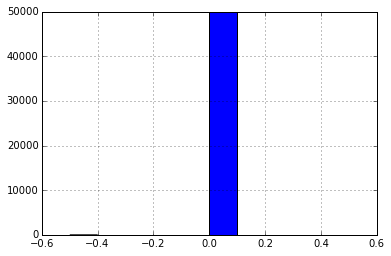

In [113]:
data_o['VAR_0008'].hist()

In [114]:
# Handle feature VAR_0008

for element in data_o['VAR_0008']:
    if element != False:
        print element

nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


In [115]:
# Abondan VAR_0008
data_o.pop('VAR_0008')
data_o.sample(n=5, random_state=1)

,VAR_0009,VAR_0010,VAR_0011,VAR_0012,VAR_0043,VAR_0073,VAR_0075,VAR_0156,VAR_0157,VAR_0158,...,VAR_0404,VAR_0466,VAR_0467,VAR_0493,VAR_1934,VAR0001_Q,VAR0001_R,VAR0005_C,VAR0005_N,VAR0005_S
64844,False,False,False,False,False,NaN,20JUN12:00:00:00,NaN,NaN,NaN,...,-1,-1,-1,-1,BRANCH,0,0,0,1,0
10093,False,False,False,False,False,NaN,30SEP10:00:00:00,NaN,NaN,NaN,...,-1,I,Discharged,-1,IAPS,0,0,1,0,0
61109,False,False,False,False,False,26JUL11:00:00:00,26JUL11:00:00:00,NaN,NaN,NaN,...,-1,I,-1,-1,IAPS,0,1,1,0,0
6869,False,False,False,False,False,NaN,14JUN12:00:00:00,NaN,NaN,NaN,...,-1,-1,-1,-1,MOBILE,0,0,0,1,0
39598,False,False,False,False,False,NaN,20JUL12:00:00:00,NaN,NaN,NaN,...,-1,-1,-1,-1,IAPS,0,1,0,1,0


In [116]:
# Handle VAR_0009
for element in data_o['VAR_0009']:
    if element != False:
        print element

nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


In [117]:
# Handle VAR_0010
for element in data_o['VAR_0010']:
    if element != False:
        print element

nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


In [118]:
# Handle VAR_0011

for element in data_o['VAR_0011']:
    if element != False:
        print element

nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


In [119]:
# Handle VAR_0012

for element in data_o['VAR_0012']:
    if element != False:
        print element

nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


In [121]:
# Handle VAR_0043

for element in data_o['VAR_0043']:
    if element != False:
        print element

nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


In [122]:
# Remove VAR_0009, VAR_0010, VAR_0011, VAR_0012, VAR_0043
data_o.pop('VAR_0009')
data_o.pop('VAR_0010')
data_o.pop('VAR_0011')
data_o.pop('VAR_0012')
data_o.pop('VAR_0043')
data_o.sample(n=5, random_state=1)

,VAR_0073,VAR_0075,VAR_0156,VAR_0157,VAR_0158,VAR_0159,VAR_0166,VAR_0167,VAR_0168,VAR_0169,...,VAR_0404,VAR_0466,VAR_0467,VAR_0493,VAR_1934,VAR0001_Q,VAR0001_R,VAR0005_C,VAR0005_N,VAR0005_S
64844,NaN,20JUN12:00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-1,-1,-1,-1,BRANCH,0,0,0,1,0
10093,NaN,30SEP10:00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-1,I,Discharged,-1,IAPS,0,0,1,0,0
61109,26JUL11:00:00:00,26JUL11:00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-1,I,-1,-1,IAPS,0,1,1,0,0
6869,NaN,14JUN12:00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-1,-1,-1,-1,MOBILE,0,0,0,1,0
39598,NaN,20JUL12:00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-1,-1,-1,-1,IAPS,0,1,0,1,0


In [129]:
# Handle VAR_0073
for element in data_o['VAR_0073']:
    if element != 'NaN' and element != 'nan':
        print element

nan
nan
nan
12DEC11:00:00:00
nan
10SEP11:00:00:00
nan
27APR12:00:00:00
09JAN12:00:00:00
nan
nan
nan
nan
31MAY12:00:00:00
nan
nan
nan
21OCT11:00:00:00
08NOV11:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
06APR12:00:00:00
nan
nan
05OCT11:00:00:00
nan
26JUN10:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
06SEP11:00:00:00
nan
14SEP11:00:00:00
09AUG12:00:00:00
nan
nan
27AUG12:00:00:00
03JUN12:00:00:00
nan
nan
nan
nan
19OCT11:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
03AUG10:00:00:00
nan
nan
23JUN12:00:00:00
nan
nan
nan
nan
nan
11JUL12:00:00:00
10AUG10:00:00:00
nan
nan
nan
nan
17DEC11:00:00:00
nan
nan
nan
28DEC11:00:00:00
nan
nan
nan
nan
nan
09FEB12:00:00:00
nan
nan
nan
28JAN11:00:00:00
nan
01APR12:00:00:00
30DEC11:00:00:00
02MAY10:00:00:00
21JUN12:00:00:00
nan
nan
nan
20APR12:00:00:00
nan
07MAY12:00:00:00
nan
21MAY12:00:00:00
nan
25FEB10:00:00:00
nan
nan
nan
nan
nan
nan
nan
12MAR09:00:00:00
nan
nan
nan
nan
nan
nan
nan
24JUL12:00:00:00
nan
nan
25OCT12:00:00:00
nan
nan
nan
nan
nan
nan
nan
n

In [130]:
# Remove VAR_0073
data_o.pop('VAR_0073')
data_o.sample(n=5, random_state=1)

,VAR_0075,VAR_0156,VAR_0157,VAR_0158,VAR_0159,VAR_0166,VAR_0167,VAR_0168,VAR_0169,VAR_0176,...,VAR_0404,VAR_0466,VAR_0467,VAR_0493,VAR_1934,VAR0001_Q,VAR0001_R,VAR0005_C,VAR0005_N,VAR0005_S
64844,20JUN12:00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-1,-1,-1,-1,BRANCH,0,0,0,1,0
10093,30SEP10:00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-1,I,Discharged,-1,IAPS,0,0,1,0,0
61109,26JUL11:00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-1,I,-1,-1,IAPS,0,1,1,0,0
6869,14JUN12:00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-1,-1,-1,-1,MOBILE,0,0,0,1,0
39598,20JUL12:00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-1,-1,-1,-1,IAPS,0,1,0,1,0


In [131]:
# Handle VAR_0075
data_o['VAR_0075']

75322     29APR12:00:00:00
20867     17SEP10:00:00:00
21240     04OCT12:00:00:00
138845    12MAR09:00:00:00
21185     17APR12:00:00:00
71925     18DEC10:00:00:00
47986     14AUG12:00:00:00
88003     05JUL09:00:00:00
131406    15DEC11:00:00:00
51788     12JAN12:00:00:00
71903     28SEP12:00:00:00
82165     20SEP12:00:00:00
72163     08AUG12:00:00:00
140828    17NOV08:00:00:00
97696     23JUN12:00:00:00
97797     02MAY12:00:00:00
55325     20FEB12:00:00:00
48813     21OCT11:00:00:00
61171     30SEP11:00:00:00
38932     23SEP10:00:00:00
67122     26JUL12:00:00:00
9534      17APR12:00:00:00
34584     27SEP12:00:00:00
130100    22MAR12:00:00:00
70664     28JUL12:00:00:00
115665    29SEP12:00:00:00
77368     20JUN12:00:00:00
13859     15SEP10:00:00:00
90019     24JUL12:00:00:00
62336     01OCT11:00:00:00
                ...       
77953     04FEB12:00:00:00
130635    16NOV10:00:00:00
37007     03DEC11:00:00:00
91941     31MAY12:00:00:00
80964     23NOV11:00:00:00
37858     12APR12:00:00:00
3

In [133]:
# Remove VAR_0075
VAR_0075 = data_o.pop('VAR_0075')
data_o.sample(n=5, random_state=1)

,VAR_0156,VAR_0157,VAR_0158,VAR_0159,VAR_0166,VAR_0167,VAR_0168,VAR_0169,VAR_0176,VAR_0177,...,VAR_0404,VAR_0466,VAR_0467,VAR_0493,VAR_1934,VAR0001_Q,VAR0001_R,VAR0005_C,VAR0005_N,VAR0005_S
64844,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-1,-1,-1,-1,BRANCH,0,0,0,1,0
10093,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-1,I,Discharged,-1,IAPS,0,0,1,0,0
61109,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-1,I,-1,-1,IAPS,0,1,1,0,0
6869,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-1,-1,-1,-1,MOBILE,0,0,0,1,0
39598,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-1,-1,-1,-1,IAPS,0,1,0,1,0


In [136]:
# Handle VAR_0156
for element in data_o['VAR_0156']:
    if element != 'NaN' and element != 'nan':
        print element

nan
nan
nan
nan
nan
nan
nan
nan
04JAN12:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
13AUG12:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
11JUL12:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
01FEB12:00:00:00
nan
nan
nan
nan
nan
15MAR12:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
20OCT11:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
29JUN12:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
08SEP11:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


In [137]:
# Handle VAR_0157
for element in data_o['VAR_0157']:
    if element != 'NaN' and element != 'nan':
        print element

nan
nan
nan
nan
nan
nan
nan
nan
19JAN12:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
07JUL12:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
na

In [138]:
# Handle VAR_0158
for element in data_o['VAR_0158']:
    if element != 'NaN' and element != 'nan':
        print element

nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
10JUL12:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan

In [139]:
# Handle VAR_0159
for element in data_o['VAR_0159']:
    if element != 'NaN' and element != 'nan':
        print element

nan
nan
nan
nan
nan
nan
nan
nan
04JAN12:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
13AUG12:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
11JUL12:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
01FEB12:00:00:00
nan
nan
nan
nan
nan
15MAR12:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
26JUL12:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
29JUN12:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
08SEP11:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


In [141]:
# Handle VAR_0166
for element in data_o['VAR_0166']:
    if element != 'NaN' and element != 'nan':
        print element

nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
21OCT11:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
11AUG11:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
08AUG09:00:00:00
nan
nan
nan
nan
nan
nan
02JUN07:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
21JUL10:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
28JAN11:00:00:00
nan
26JAN12:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
16DEC10:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
05MAY06:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
10OCT11:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
02AUG10:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
08DEC08:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
19AUG11:00:00:00
nan
29JAN11:00:00:00
nan
nan
nan
nan
nan
nan
na

In [142]:
# Handle VAR_0167
for element in data_o['VAR_0167']:
    if element != 'NaN' and element != 'nan':
        print element

nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
20MAY06:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
25OCT10:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
na

In [143]:
# Handle VAR_0168
for element in data_o['VAR_0168']:
    if element != 'NaN' and element != 'nan':
        print element

nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
15FEB12:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
20OCT11:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
12DEC10:00:00:00
nan
nan
nan
nan
nan
nan
23DEC10:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
25DEC10:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
11MAR11:00:00:00
nan
01MAR12:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
20OCT11:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
06MAR09:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
01MAR12:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
22MAR11:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
01JUN09:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
03NOV11:00:00:00
nan
08SEP11:00:00:00
nan
nan
nan
nan
nan
nan
na

In [144]:
# Handle VAR_0169
for element in data_o['VAR_0169']:
    if element != 'NaN' and element != 'nan':
        print element

nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
21OCT11:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
22SEP11:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
08AUG09:00:00:00
nan
nan
nan
nan
nan
nan
10AUG10:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
21JUL10:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
28JAN11:00:00:00
nan
15MAR12:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
29JUN11:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
26NOV08:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
10OCT11:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
03NOV10:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
19MAR09:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
19AUG11:00:00:00
nan
06AUG11:00:00:00
nan
nan
nan
nan
nan
nan
na

In [145]:
# Handle VAR_0176
for element in data_o['VAR_0176']:
    if element != 'NaN' and element != 'nan':
        print element

nan
nan
nan
nan
nan
nan
nan
nan
04JAN12:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
21OCT11:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
13AUG12:00:00:00
nan
nan
nan
nan
nan
11AUG11:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
08AUG09:00:00:00
nan
nan
nan
nan
nan
11JUL12:00:00:00
02JUN07:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
21JUL10:00:00:00
nan
nan
nan
nan
nan
01FEB12:00:00:00
nan
nan
nan
28JAN11:00:00:00
nan
26JAN12:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
16DEC10:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
05MAY06:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
10OCT11:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
02AUG10:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
08DEC08:00:00:00
nan
nan
nan
nan
29JUN12:00:00:00
nan
nan
nan
nan

In [146]:
# Handle VAR_0177
for element in data_o['VAR_0177']:
    if element != 'NaN' and element != 'nan':
        print element

nan
nan
nan
nan
nan
nan
nan
nan
19JAN12:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
20MAY06:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
07JUL12:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
25OCT10:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan


In [147]:
# Remove VAR 
data_o.pop('VAR_0156')
data_o.pop('VAR_0157')
data_o.pop('VAR_0158')
data_o.pop('VAR_0159')
data_o.pop('VAR_0166')
data_o.pop('VAR_0167')
data_o.pop('VAR_0168')
data_o.pop('VAR_0169')
data_o.pop('VAR_0176')
data_o.pop('VAR_0177')
data_o.sample(n=5, random_state=1)

,VAR_0178,VAR_0179,VAR_0196,VAR_0200,VAR_0202,VAR_0204,VAR_0214,VAR_0216,VAR_0217,VAR_0222,...,VAR_0404,VAR_0466,VAR_0467,VAR_0493,VAR_1934,VAR0001_Q,VAR0001_R,VAR0005_C,VAR0005_N,VAR0005_S
64844,NaN,NaN,False,FLORENCE,BatchInquiry,31JAN14:15:43:00,NaN,DS,20JUN12:02:00:00,C6,...,-1,-1,-1,-1,BRANCH,0,0,0,1,0
10093,NaN,NaN,False,COMMERCE CITY,BatchInquiry,31JAN14:16:27:00,NaN,DS,04JUL12:02:00:00,C6,...,-1,I,Discharged,-1,IAPS,0,0,1,0,0
61109,NaN,NaN,False,KNOXVILLE,BatchInquiry,31JAN14:18:09:00,NaN,DS,06AUG12:02:00:00,C6,...,-1,I,-1,-1,IAPS,0,1,1,0,0
6869,NaN,NaN,False,FINDLAY,BatchInquiry,31JAN14:15:24:00,NaN,DS,14JUN12:02:00:00,C6,...,-1,-1,-1,-1,MOBILE,0,0,0,1,0
39598,NaN,NaN,False,YORBA LINDA,BatchInquiry,31JAN14:17:16:00,NaN,DS,20JUL12:02:00:00,C6,...,-1,-1,-1,-1,IAPS,0,1,0,1,0


In [148]:
# Handle VAR_0178
for element in data_o['VAR_0178']:
    if element != 'NaN' and element != 'nan':
        print element

nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
15FEB12:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
20OCT11:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
12DEC10:00:00:00
nan
nan
nan
nan
nan
nan
23DEC10:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
25DEC10:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
11MAR11:00:00:00
nan
01MAR12:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
20OCT11:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
06MAR09:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
01MAR12:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
10JUL12:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
01JUN09:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
03NOV11:00:00:00
nan
08SEP11:00:00:00
nan
nan
nan
nan
nan
nan
na

In [149]:
# Handle VAR_0179
for element in data_o['VAR_0179']:
    if element != 'NaN' and element != 'nan':
        print element

nan
nan
nan
nan
nan
nan
nan
nan
04JAN12:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
21OCT11:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
13AUG12:00:00:00
nan
nan
nan
nan
nan
22SEP11:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
08AUG09:00:00:00
nan
nan
nan
nan
nan
11JUL12:00:00:00
10AUG10:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
21JUL10:00:00:00
nan
nan
nan
nan
nan
01FEB12:00:00:00
nan
nan
nan
28JAN11:00:00:00
nan
15MAR12:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
29JUN11:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
26NOV08:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
10OCT11:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
26JUL12:00:00:00
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
19MAR09:00:00:00
nan
nan
nan
nan
29JUN12:00:00:00
nan
nan
nan
nan

In [150]:
# Handle VAR_0196
for element in data_o['VAR_0196']:
    if element != False:
        print element

nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


In [151]:
# Remove VAR_0178, VAR_0179, VAR_0196

data_o.pop('VAR_0178')
data_o.pop('VAR_0179')
data_o.pop('VAR_0196')
data_o.sample(n=5, random_state=1)

,VAR_0200,VAR_0202,VAR_0204,VAR_0214,VAR_0216,VAR_0217,VAR_0222,VAR_0226,VAR_0229,VAR_0230,...,VAR_0404,VAR_0466,VAR_0467,VAR_0493,VAR_1934,VAR0001_Q,VAR0001_R,VAR0005_C,VAR0005_N,VAR0005_S
64844,FLORENCE,BatchInquiry,31JAN14:15:43:00,NaN,DS,20JUN12:02:00:00,C6,False,False,False,...,-1,-1,-1,-1,BRANCH,0,0,0,1,0
10093,COMMERCE CITY,BatchInquiry,31JAN14:16:27:00,NaN,DS,04JUL12:02:00:00,C6,False,False,False,...,-1,I,Discharged,-1,IAPS,0,0,1,0,0
61109,KNOXVILLE,BatchInquiry,31JAN14:18:09:00,NaN,DS,06AUG12:02:00:00,C6,False,False,False,...,-1,I,-1,-1,IAPS,0,1,1,0,0
6869,FINDLAY,BatchInquiry,31JAN14:15:24:00,NaN,DS,14JUN12:02:00:00,C6,False,False,False,...,-1,-1,-1,-1,MOBILE,0,0,0,1,0
39598,YORBA LINDA,BatchInquiry,31JAN14:17:16:00,NaN,DS,20JUL12:02:00:00,C6,False,False,False,...,-1,-1,-1,-1,IAPS,0,1,0,1,0


In [153]:
# Handle VAR_0202
for element in data_o['VAR_0202']:
    if element != 'BatchInquiry':
        print element

nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


In [154]:
# Handle VAR_0214
for element in data_o['VAR_0214']:
    if element != 'NaN' and element != 'nan':
        print element

nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


In [156]:
# Handle VAR_0216
for element in data_o['VAR_0216']:
    if element != 'DS':
        print element

nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


In [157]:
# Handle VAR_0222
for element in data_o['VAR_0222']:
    if element != 'C6':
        print element

nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


In [159]:
# Handle VAR_0226
for element in data_o['VAR_0226']:
    if element != False:
        print element

nan
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
nan
True
True
True
True
True
True
nan
True
True
True
True
True
nan
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
nan
True
True
True
nan
True
True
True
True
True
True
True
True
nan
True
nan
True
True
True
True
True
nan
True
True
True
True
True
nan
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
nan
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
nan
nan
True
True
True
True
True
True
True
True
True
nan
True
True
True
True
True
True
True
True
nan
True
True
True
True
True
True
True
True
True
True
True
nan
True
nan
True
True
True
True
True
True
True
True
nan
True
True


In [160]:
# Handle VAR_0229
for element in data_o['VAR_0229']:
    if element != False:
        print element

nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


In [161]:
# Handle VAR_0230
for element in data_o['VAR_0230']:
    if element != False:
        print element

nan
True
True
True
True
True
True
True
True
True
True
True
True
nan
True
True
True
True
nan
nan
True
True
True
True
True
True
True
True
True
nan
nan
True
True
True
True
True
nan
nan
True
True
True
nan
nan
True
True
True
True
True
nan
True
True
True
True
True
nan
True
nan
True
True
True
nan
True
True
True
True
nan
True
True
True
nan
nan
True
nan
True
True


In [162]:
# Remove above features

data_o.pop('VAR_0202')
data_o.pop('VAR_0214')
data_o.pop('VAR_0216')
data_o.pop('VAR_0222')
VAR_0226 = data_o.pop('VAR_0226')
data_o.pop('VAR_0229')
VAR_0230 = data_o.pop('VAR_0230')
data_o.sample(n=5, random_state=1)

,VAR_0200,VAR_0204,VAR_0217,VAR_0232,VAR_0236,VAR_0237,VAR_0239,VAR_0274,VAR_0283,VAR_0305,...,VAR_0404,VAR_0466,VAR_0467,VAR_0493,VAR_1934,VAR0001_Q,VAR0001_R,VAR0005_C,VAR0005_N,VAR0005_S
64844,FLORENCE,31JAN14:15:43:00,20JUN12:02:00:00,True,True,CO,False,FL,S,S,...,-1,-1,-1,-1,BRANCH,0,0,0,1,0
10093,COMMERCE CITY,31JAN14:16:27:00,04JUL12:02:00:00,False,True,CO,False,CO,H,H,...,-1,I,Discharged,-1,IAPS,0,0,1,0,0
61109,KNOXVILLE,31JAN14:18:09:00,06AUG12:02:00:00,False,True,TN,False,TN,S,S,...,-1,I,-1,-1,IAPS,0,1,1,0,0
6869,FINDLAY,31JAN14:15:24:00,14JUN12:02:00:00,True,True,OH,False,OH,S,S,...,-1,-1,-1,-1,MOBILE,0,0,0,1,0
39598,YORBA LINDA,31JAN14:17:16:00,20JUL12:02:00:00,True,True,CA,False,CA,S,S,...,-1,-1,-1,-1,IAPS,0,1,0,1,0


In [163]:
data_o.pop('VAR_0204')
data_o.pop('VAR_0217')
data_o.sample(n=5, random_state=1)

,VAR_0200,VAR_0232,VAR_0236,VAR_0237,VAR_0239,VAR_0274,VAR_0283,VAR_0305,VAR_0325,VAR_0342,...,VAR_0404,VAR_0466,VAR_0467,VAR_0493,VAR_1934,VAR0001_Q,VAR0001_R,VAR0005_C,VAR0005_N,VAR0005_S
64844,FLORENCE,True,True,CO,False,FL,S,S,S,EE,...,-1,-1,-1,-1,BRANCH,0,0,0,1,0
10093,COMMERCE CITY,False,True,CO,False,CO,H,H,S,DF,...,-1,I,Discharged,-1,IAPS,0,0,1,0,0
61109,KNOXVILLE,False,True,TN,False,TN,S,S,S,EF,...,-1,I,-1,-1,IAPS,0,1,1,0,0
6869,FINDLAY,True,True,OH,False,OH,S,S,S,FE,...,-1,-1,-1,-1,MOBILE,0,0,0,1,0
39598,YORBA LINDA,True,True,CA,False,CA,S,S,-1,-1,...,-1,-1,-1,-1,IAPS,0,1,0,1,0


In [165]:
# Handle VAR_0232 which will generate dummy variable
count = 0
for element in data_o['VAR_0232']:
    if element != False:
        count += 1
print count

28400


In [166]:
# Handle VAR_0236 which will be abandoned
count = 0
for element in data_o['VAR_0236']:
    if element != False:
        count += 1
print count

49882


In [167]:
# Handle VAR_0239 which will be abandoned
count = 0
for element in data_o['VAR_0239']:
    if element != False:
        count += 1
print count

18


In [170]:
data_o.pop('VAR_0236')
data_o.pop('VAR_0239')
data_o.sample(n=10, random_state=1)

,VAR_0200,VAR_0232,VAR_0237,VAR_0274,VAR_0283,VAR_0305,VAR_0325,VAR_0342,VAR_0352,VAR_0353,...,VAR_0404,VAR_0466,VAR_0467,VAR_0493,VAR_1934,VAR0001_Q,VAR0001_R,VAR0005_C,VAR0005_N,VAR0005_S
64844,FLORENCE,True,CO,FL,S,S,S,EE,U,O,...,-1,-1,-1,-1,BRANCH,0,0,0,1,0
10093,COMMERCE CITY,False,CO,CO,H,H,S,DF,O,U,...,-1,I,Discharged,-1,IAPS,0,0,1,0,0
61109,KNOXVILLE,False,TN,TN,S,S,S,EF,U,U,...,-1,I,-1,-1,IAPS,0,1,1,0,0
6869,FINDLAY,True,OH,OH,S,S,S,FE,O,O,...,-1,-1,-1,-1,MOBILE,0,0,0,1,0
39598,YORBA LINDA,True,CA,CA,S,S,-1,-1,O,-1,...,-1,-1,-1,-1,IAPS,0,1,0,1,0
107278,HAMPTON,True,SC,SC,S,H,S,EF,R,U,...,-1,-1,-1,-1,IAPS,0,1,1,0,0
113405,RANCHO CUCAMONGA,True,CA,CA,H,H,H,EE,R,R,...,-1,-1,-1,-1,IAPS,0,1,1,0,0
35174,BEAUFORT,True,SC,SC,S,S,H,FE,O,R,...,-1,-1,-1,-1,IAPS,0,0,1,0,0
9955,BEDFORD,False,TX,AZ,H,H,S,DE,R,O,...,-1,I,Discharged,-1,IAPS,0,1,1,0,0
74498,NORTH RICHLAND HILLS,False,TX,PA,S,S,H,FE,U,R,...,-1,-1,-1,-1,IAPS,0,1,0,0,0


In [173]:
# Abandon VAR_0274, VAR_0305, VAR_0325, VAR_0353
data_o.pop('VAR_0274')
data_o.pop('VAR_0305')
data_o.pop('VAR_0325')
data_o.pop('VAR_0353')
data_o.sample(n=10, random_state=1)

,VAR_0200,VAR_0232,VAR_0237,VAR_0283,VAR_0342,VAR_0352,VAR_0354,VAR_0404,VAR_0466,VAR_0467,VAR_0493,VAR_1934,VAR0001_Q,VAR0001_R,VAR0005_C,VAR0005_N,VAR0005_S
64844,FLORENCE,True,CO,S,EE,U,U,-1,-1,-1,-1,BRANCH,0,0,0,1,0
10093,COMMERCE CITY,False,CO,H,DF,O,O,-1,I,Discharged,-1,IAPS,0,0,1,0,0
61109,KNOXVILLE,False,TN,S,EF,U,U,-1,I,-1,-1,IAPS,0,1,1,0,0
6869,FINDLAY,True,OH,S,FE,O,R,-1,-1,-1,-1,MOBILE,0,0,0,1,0
39598,YORBA LINDA,True,CA,S,-1,O,-1,-1,-1,-1,-1,IAPS,0,1,0,1,0
107278,HAMPTON,True,SC,S,EF,R,-1,-1,-1,-1,-1,IAPS,0,1,1,0,0
113405,RANCHO CUCAMONGA,True,CA,H,EE,R,O,-1,-1,-1,-1,IAPS,0,1,1,0,0
35174,BEAUFORT,True,SC,S,FE,O,U,-1,-1,-1,-1,IAPS,0,0,1,0,0
9955,BEDFORD,False,TX,H,DE,R,-1,-1,I,Discharged,-1,IAPS,0,1,1,0,0
74498,NORTH RICHLAND HILLS,False,TX,S,FE,U,R,-1,-1,-1,-1,IAPS,0,1,0,0,0


In [174]:
data_o.pop('VAR_0354')
data_o.sample(n=10, random_state=1)

,VAR_0200,VAR_0232,VAR_0237,VAR_0283,VAR_0342,VAR_0352,VAR_0404,VAR_0466,VAR_0467,VAR_0493,VAR_1934,VAR0001_Q,VAR0001_R,VAR0005_C,VAR0005_N,VAR0005_S
64844,FLORENCE,True,CO,S,EE,U,-1,-1,-1,-1,BRANCH,0,0,0,1,0
10093,COMMERCE CITY,False,CO,H,DF,O,-1,I,Discharged,-1,IAPS,0,0,1,0,0
61109,KNOXVILLE,False,TN,S,EF,U,-1,I,-1,-1,IAPS,0,1,1,0,0
6869,FINDLAY,True,OH,S,FE,O,-1,-1,-1,-1,MOBILE,0,0,0,1,0
39598,YORBA LINDA,True,CA,S,-1,O,-1,-1,-1,-1,IAPS,0,1,0,1,0
107278,HAMPTON,True,SC,S,EF,R,-1,-1,-1,-1,IAPS,0,1,1,0,0
113405,RANCHO CUCAMONGA,True,CA,H,EE,R,-1,-1,-1,-1,IAPS,0,1,1,0,0
35174,BEAUFORT,True,SC,S,FE,O,-1,-1,-1,-1,IAPS,0,0,1,0,0
9955,BEDFORD,False,TX,H,DE,R,-1,I,Discharged,-1,IAPS,0,1,1,0,0
74498,NORTH RICHLAND HILLS,False,TX,S,FE,U,-1,-1,-1,-1,IAPS,0,1,0,0,0


In [176]:
# Handle VAR_0404 which will be abandoned
count = 0
for element in data_o['VAR_0404']:
    if element != '-1':
        count += 1
        print element
print count

CONTACT
nan
PRESIDENT
nan
INDIVIDUAL - SOLE OWNER
TREASURER
DIRECTOR OF ADMISSIONS
AGENT
MEMBER
AGENT
INCORPORATOR
MANAGER
CONTACT
nan
OWNER
CONTA
VICE PRESIDENT
DIRECTOR
PROFESSOR
CONTACT
AGENT
MAINTENANCE AND CLEANING
SECRETARY
MEMBER
PRESIDENT
PRESIDENT
CEO;SECRETARY;CFO
CONTACT
MEMBER MANAGER
MANAGER
MEMBERSHIP CONSULTANT
CONTACT
CHIEF EXECUTIVE OFFICER , FACILITAT
CONTA
INDIVIDUAL - SOLE OWNER
REGISTRANT
CONTACT
MANAGER
OWNER
PRESIDENT
TREASURER
CONTACT
OWNER
MANAGER
AGENT
OFFICE MANAGER
MARKETING REPRESENTATIVE
CONTACT
TAX RESPONSIBLE PARTY
AGENT
VICE PRESIDENT
CFO
VICE PRESIDENT
nan
nan
PRESIDENT
EXECUTIVE VICE PRESIDENT, DIRECTOR
DIRECTOR
VICE PRESIDENT
AGENT
CONTACT
CONTACT
CONTACT
PRESIDENT
RETIREMENT SPECIALIST
PRESIDENT
CONTACT
DIRECTOR OF EMERGENCY ROOM
AGENT
DIRECTOR
OWNER
nan
SECRETARY
AGENT
MANAGER
CONTACT
CONTACT
BOARD MEMBER
SECRETARY
TAX RESPONSIBLE PARTY
MEMBER/MANAGER
SECRETARY
PRESIDENT
SECRETARY
REGIONAL SALES MANAGER NORTH WEST
MANAGER
PRESIDENT
nan
PTD
OWNER
na

In [183]:
# Handle VAR_0466 which will be used
count = 0
for element in data_o['VAR_0466']:
    if element != '-1':
        count += 1
print count

8136


In [182]:
# Handle VAR_0467 which will be used
count = 0
for element in data_o['VAR_0467']:
    if element != '-1':
        count += 1
print count

8066


In [185]:
# Handle VAR_0493 which will be abandoned
count = 0
for element in data_o['VAR_0493']:
    if element != '-1':
        count += 1
print count

PRACTICAL NURSE
LICENSED PRACTICAL NURSE
PHARMACY TECHNICIAN
LICENSED PRACTICAL NURSE
LICENSED MASSAGE THERAPIST
nan
MORTGAGE BROKER - INDIVIDUAL
nan
REAL ESTATE
OCCUPATIONAL THERAPY ASSISTANT
LICENSED PRACTICAL NURSE
CERTIFIED ADDICTION COUNSELOR III
PRACTICAL NURSE
ELECTRICIANS
PROFESSIONAL NURSE
REAL ESTATE
ARCHITECT
LICENSED PRACTICAL NURSE
LICENSED VOCATIONAL NURSE
PHARMACY TECHNICIAN
REAL ESTATE ASSOCIATE BROKER
nan
ASSOCIATE REAL ESTATE APPRAISER
COSMETOLOGISTS
OCCUPATIONAL THERAPIST ASSISTANT
PHYSICIAN ASSISTANT
DENTAL HYGIENIST
LICENSED PRACTICAL NURSE
COSMETOLOGIST
LICENSED SOCIAL WORKER
OPTICIANS
PHARMACY TECHNICIAN
LICENSED VOCATIONAL NURSE
PROFESSIONAL COUNSELOR
PHARMACY TECHNICIAN
LICENSED PRACTICAL NURSE
LPN
PROFESSIONAL ENGINEER
CHIROPRACTIC
PERMANENT EMPLOYEE REGISTRATION CARD
NURSE
GUARD
REGISTERED NURSE
PRACTICAL NURSE
FIELD REPRESENTATIVE
PROFESSIONAL ENGINEER
nan
nan
COSMETOLOGIST
REAL ESTATE
PERMANENT EMPLOYEE REGISTRATION CARD
LICENSED PRACTICAL NURSE
PERMANENT E

In [186]:
data_o.pop('VAR_0404')
data_o.pop('VAR_0493')
data_o.sample(n=10, random_state=1)

,VAR_0200,VAR_0232,VAR_0237,VAR_0283,VAR_0342,VAR_0352,VAR_0466,VAR_0467,VAR_1934,VAR0001_Q,VAR0001_R,VAR0005_C,VAR0005_N,VAR0005_S
64844,FLORENCE,True,CO,S,EE,U,-1,-1,BRANCH,0,0,0,1,0
10093,COMMERCE CITY,False,CO,H,DF,O,I,Discharged,IAPS,0,0,1,0,0
61109,KNOXVILLE,False,TN,S,EF,U,I,-1,IAPS,0,1,1,0,0
6869,FINDLAY,True,OH,S,FE,O,-1,-1,MOBILE,0,0,0,1,0
39598,YORBA LINDA,True,CA,S,-1,O,-1,-1,IAPS,0,1,0,1,0
107278,HAMPTON,True,SC,S,EF,R,-1,-1,IAPS,0,1,1,0,0
113405,RANCHO CUCAMONGA,True,CA,H,EE,R,-1,-1,IAPS,0,1,1,0,0
35174,BEAUFORT,True,SC,S,FE,O,-1,-1,IAPS,0,0,1,0,0
9955,BEDFORD,False,TX,H,DE,R,I,Discharged,IAPS,0,1,1,0,0
74498,NORTH RICHLAND HILLS,False,TX,S,FE,U,-1,-1,IAPS,0,1,0,0,0


In [187]:
# Handle VAR_0200 which will be abandoned
count = 0
for element in data_o['VAR_0200']:
    if element != 'FLORENCE':
        count += 1
print count

49923


In [188]:
VAR_0200 = data_o.pop('VAR_0200')
data_o.sample(n=10, random_state=1)

,VAR_0232,VAR_0237,VAR_0283,VAR_0342,VAR_0352,VAR_0466,VAR_0467,VAR_1934,VAR0001_Q,VAR0001_R,VAR0005_C,VAR0005_N,VAR0005_S
64844,True,CO,S,EE,U,-1,-1,BRANCH,0,0,0,1,0
10093,False,CO,H,DF,O,I,Discharged,IAPS,0,0,1,0,0
61109,False,TN,S,EF,U,I,-1,IAPS,0,1,1,0,0
6869,True,OH,S,FE,O,-1,-1,MOBILE,0,0,0,1,0
39598,True,CA,S,-1,O,-1,-1,IAPS,0,1,0,1,0
107278,True,SC,S,EF,R,-1,-1,IAPS,0,1,1,0,0
113405,True,CA,H,EE,R,-1,-1,IAPS,0,1,1,0,0
35174,True,SC,S,FE,O,-1,-1,IAPS,0,0,1,0,0
9955,False,TX,H,DE,R,I,Discharged,IAPS,0,1,1,0,0
74498,False,TX,S,FE,U,-1,-1,IAPS,0,1,0,0,0


In [189]:
# create dummy variable for VAR0232
var0232_dummies = pd.get_dummies(data_o.VAR_0232, prefix='VAR0232')

# drop the first column
var0232_dummies.drop(var0232_dummies.columns[0], axis=1, inplace=True)

# concatenate the original DataFrame and the dummy DataFrame (axis=0 means rows, axis=1 means columns)
data_ob = pd.concat([data_o, var0232_dummies], axis=1)
data_ob.sample(n=5, random_state=1) 

,VAR_0232,VAR_0237,VAR_0283,VAR_0342,VAR_0352,VAR_0466,VAR_0467,VAR_1934,VAR0001_Q,VAR0001_R,VAR0005_C,VAR0005_N,VAR0005_S,VAR0232_True
64844,True,CO,S,EE,U,-1,-1,BRANCH,0,0,0,1,0,1
10093,False,CO,H,DF,O,I,Discharged,IAPS,0,0,1,0,0,0
61109,False,TN,S,EF,U,I,-1,IAPS,0,1,1,0,0,0
6869,True,OH,S,FE,O,-1,-1,MOBILE,0,0,0,1,0,1
39598,True,CA,S,-1,O,-1,-1,IAPS,0,1,0,1,0,1


In [190]:
# create dummy variable for VAR0283
var0283_dummies = pd.get_dummies(data_ob.VAR_0283, prefix='VAR0283')

# drop the first column
var0283_dummies.drop(var0283_dummies.columns[0], axis=1, inplace=True)

# concatenate the original DataFrame and the dummy DataFrame (axis=0 means rows, axis=1 means columns)
data_obj = pd.concat([data_ob, var0283_dummies], axis=1)
data_obj.sample(n=5, random_state=1) 

,VAR_0232,VAR_0237,VAR_0283,VAR_0342,VAR_0352,VAR_0466,VAR_0467,VAR_1934,VAR0001_Q,VAR0001_R,VAR0005_C,VAR0005_N,VAR0005_S,VAR0232_True,VAR0283_F,VAR0283_H,VAR0283_P,VAR0283_R,VAR0283_S,VAR0283_U
64844,True,CO,S,EE,U,-1,-1,BRANCH,0,0,0,1,0,1,0,0,0,0,1,0
10093,False,CO,H,DF,O,I,Discharged,IAPS,0,0,1,0,0,0,0,1,0,0,0,0
61109,False,TN,S,EF,U,I,-1,IAPS,0,1,1,0,0,0,0,0,0,0,1,0
6869,True,OH,S,FE,O,-1,-1,MOBILE,0,0,0,1,0,1,0,0,0,0,1,0
39598,True,CA,S,-1,O,-1,-1,IAPS,0,1,0,1,0,1,0,0,0,0,1,0


In [191]:
# create dummy variable for VAR0342
var0342_dummies = pd.get_dummies(data_obj.VAR_0342, prefix='VAR0342')

# drop the first column
var0342_dummies.drop(var0342_dummies.columns[0], axis=1, inplace=True)

# concatenate the original DataFrame and the dummy DataFrame (axis=0 means rows, axis=1 means columns)
data_obje = pd.concat([data_obj, var0342_dummies], axis=1)
data_obje.sample(n=5, random_state=1) 

,VAR_0232,VAR_0237,VAR_0283,VAR_0342,VAR_0352,VAR_0466,VAR_0467,VAR_1934,VAR0001_Q,VAR0001_R,...,VAR0342_FE,VAR0342_FF,VAR0342_FU,VAR0342_UA,VAR0342_UB,VAR0342_UC,VAR0342_UD,VAR0342_UE,VAR0342_UF,VAR0342_UU
64844,True,CO,S,EE,U,-1,-1,BRANCH,0,0,...,0,0,0,0,0,0,0,0,0,0
10093,False,CO,H,DF,O,I,Discharged,IAPS,0,0,...,0,0,0,0,0,0,0,0,0,0
61109,False,TN,S,EF,U,I,-1,IAPS,0,1,...,0,0,0,0,0,0,0,0,0,0
6869,True,OH,S,FE,O,-1,-1,MOBILE,0,0,...,1,0,0,0,0,0,0,0,0,0
39598,True,CA,S,-1,O,-1,-1,IAPS,0,1,...,0,0,0,0,0,0,0,0,0,0


In [192]:
# create dummy variable for VAR0352
var0352_dummies = pd.get_dummies(data_obje.VAR_0352, prefix='VAR0352')

# drop the first column
var0352_dummies.drop(var0352_dummies.columns[0], axis=1, inplace=True)

# concatenate the original DataFrame and the dummy DataFrame (axis=0 means rows, axis=1 means columns)
data_objec = pd.concat([data_obje, var0352_dummies], axis=1)
data_objec.sample(n=5, random_state=1)

,VAR_0232,VAR_0237,VAR_0283,VAR_0342,VAR_0352,VAR_0466,VAR_0467,VAR_1934,VAR0001_Q,VAR0001_R,...,VAR0342_UA,VAR0342_UB,VAR0342_UC,VAR0342_UD,VAR0342_UE,VAR0342_UF,VAR0342_UU,VAR0352_O,VAR0352_R,VAR0352_U
64844,True,CO,S,EE,U,-1,-1,BRANCH,0,0,...,0,0,0,0,0,0,0,0,0,1
10093,False,CO,H,DF,O,I,Discharged,IAPS,0,0,...,0,0,0,0,0,0,0,1,0,0
61109,False,TN,S,EF,U,I,-1,IAPS,0,1,...,0,0,0,0,0,0,0,0,0,1
6869,True,OH,S,FE,O,-1,-1,MOBILE,0,0,...,0,0,0,0,0,0,0,1,0,0
39598,True,CA,S,-1,O,-1,-1,IAPS,0,1,...,0,0,0,0,0,0,0,1,0,0


In [193]:
# create dummy variable for VAR0466
var0466_dummies = pd.get_dummies(data_objec.VAR_0466, prefix='VAR0466')

# drop the first column
var0466_dummies.drop(var0466_dummies.columns[0], axis=1, inplace=True)

# concatenate the original DataFrame and the dummy DataFrame (axis=0 means rows, axis=1 means columns)
data_1 = pd.concat([data_objec, var0466_dummies], axis=1)
data_1.sample(n=5, random_state=1)

,VAR_0232,VAR_0237,VAR_0283,VAR_0342,VAR_0352,VAR_0466,VAR_0467,VAR_1934,VAR0001_Q,VAR0001_R,...,VAR0342_UB,VAR0342_UC,VAR0342_UD,VAR0342_UE,VAR0342_UF,VAR0342_UU,VAR0352_O,VAR0352_R,VAR0352_U,VAR0466_I
64844,True,CO,S,EE,U,-1,-1,BRANCH,0,0,...,0,0,0,0,0,0,0,0,1,0
10093,False,CO,H,DF,O,I,Discharged,IAPS,0,0,...,0,0,0,0,0,0,1,0,0,1
61109,False,TN,S,EF,U,I,-1,IAPS,0,1,...,0,0,0,0,0,0,0,0,1,1
6869,True,OH,S,FE,O,-1,-1,MOBILE,0,0,...,0,0,0,0,0,0,1,0,0,0
39598,True,CA,S,-1,O,-1,-1,IAPS,0,1,...,0,0,0,0,0,0,1,0,0,0


In [194]:
# create dummy variable for VAR0467
var0467_dummies = pd.get_dummies(data_1.VAR_0467, prefix='VAR0467')

# drop the first column
var0467_dummies.drop(var0467_dummies.columns[0], axis=1, inplace=True)

# concatenate the original DataFrame and the dummy DataFrame (axis=0 means rows, axis=1 means columns)
data_2 = pd.concat([data_1, var0467_dummies], axis=1)
data_2.sample(n=5, random_state=1)

,VAR_0232,VAR_0237,VAR_0283,VAR_0342,VAR_0352,VAR_0466,VAR_0467,VAR_1934,VAR0001_Q,VAR0001_R,...,VAR0342_UE,VAR0342_UF,VAR0342_UU,VAR0352_O,VAR0352_R,VAR0352_U,VAR0466_I,VAR0467_Discharge NA,VAR0467_Discharged,VAR0467_Dismissed
64844,True,CO,S,EE,U,-1,-1,BRANCH,0,0,...,0,0,0,0,0,1,0,0,0,0
10093,False,CO,H,DF,O,I,Discharged,IAPS,0,0,...,0,0,0,1,0,0,1,0,1,0
61109,False,TN,S,EF,U,I,-1,IAPS,0,1,...,0,0,0,0,0,1,1,0,0,0
6869,True,OH,S,FE,O,-1,-1,MOBILE,0,0,...,0,0,0,1,0,0,0,0,0,0
39598,True,CA,S,-1,O,-1,-1,IAPS,0,1,...,0,0,0,1,0,0,0,0,0,0


In [195]:
# create dummy variable for VAR1934
var1934_dummies = pd.get_dummies(data_2.VAR_1934, prefix='VAR1934')

# drop the first column
var1934_dummies.drop(var1934_dummies.columns[0], axis=1, inplace=True)

# concatenate the original DataFrame and the dummy DataFrame (axis=0 means rows, axis=1 means columns)
data_3 = pd.concat([data_2, var1934_dummies], axis=1)
data_3.sample(n=5, random_state=1)

,VAR_0232,VAR_0237,VAR_0283,VAR_0342,VAR_0352,VAR_0466,VAR_0467,VAR_1934,VAR0001_Q,VAR0001_R,...,VAR0352_R,VAR0352_U,VAR0466_I,VAR0467_Discharge NA,VAR0467_Discharged,VAR0467_Dismissed,VAR1934_CSC,VAR1934_IAPS,VAR1934_MOBILE,VAR1934_RCC
64844,True,CO,S,EE,U,-1,-1,BRANCH,0,0,...,0,1,0,0,0,0,0,0,0,0
10093,False,CO,H,DF,O,I,Discharged,IAPS,0,0,...,0,0,1,0,1,0,0,1,0,0
61109,False,TN,S,EF,U,I,-1,IAPS,0,1,...,0,1,1,0,0,0,0,1,0,0
6869,True,OH,S,FE,O,-1,-1,MOBILE,0,0,...,0,0,0,0,0,0,0,0,1,0
39598,True,CA,S,-1,O,-1,-1,IAPS,0,1,...,0,0,0,0,0,0,0,1,0,0


In [196]:
# create dummy variable for VAR0237
var0237_dummies = pd.get_dummies(data_3.VAR_0237, prefix='VAR0237')

# drop the first column
var0237_dummies.drop(var0237_dummies.columns[0], axis=1, inplace=True)

# concatenate the original DataFrame and the dummy DataFrame (axis=0 means rows, axis=1 means columns)
data_4 = pd.concat([data_3, var0237_dummies], axis=1)
data_4.sample(n=5, random_state=1)

,VAR_0232,VAR_0237,VAR_0283,VAR_0342,VAR_0352,VAR_0466,VAR_0467,VAR_1934,VAR0001_Q,VAR0001_R,...,VAR0237_SC,VAR0237_SD,VAR0237_TN,VAR0237_TX,VAR0237_UT,VAR0237_VA,VAR0237_WA,VAR0237_WI,VAR0237_WV,VAR0237_WY
64844,True,CO,S,EE,U,-1,-1,BRANCH,0,0,...,0,0,0,0,0,0,0,0,0,0
10093,False,CO,H,DF,O,I,Discharged,IAPS,0,0,...,0,0,0,0,0,0,0,0,0,0
61109,False,TN,S,EF,U,I,-1,IAPS,0,1,...,0,0,1,0,0,0,0,0,0,0
6869,True,OH,S,FE,O,-1,-1,MOBILE,0,0,...,0,0,0,0,0,0,0,0,0,0
39598,True,CA,S,-1,O,-1,-1,IAPS,0,1,...,0,0,0,0,0,0,0,0,0,0


In [200]:
# Remove all the categorical features that have been converted to numerical features
data_4.pop('VAR_0232')
data_4.pop('VAR_0237')
data_4.pop('VAR_0283')
data_4.pop('VAR_0342')
data_4.pop('VAR_0352')
data_4.pop('VAR_0466')
data_4.pop('VAR_0467')
data_4.pop('VAR_1934')
data_4.sample(n=5, random_state=1)

,VAR0001_Q,VAR0001_R,VAR0005_C,VAR0005_N,VAR0005_S,VAR0232_True,VAR0283_F,VAR0283_H,VAR0283_P,VAR0283_R,...,VAR0237_SC,VAR0237_SD,VAR0237_TN,VAR0237_TX,VAR0237_UT,VAR0237_VA,VAR0237_WA,VAR0237_WI,VAR0237_WV,VAR0237_WY
64844,0,0,0,1,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10093,0,0,1,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
61109,0,1,1,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
6869,0,0,0,1,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
39598,0,1,0,1,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


### The numerical features that converted from categorical features

In [201]:
data_convert = data_4
data_convert.sample(n=5, random_state=1)

,VAR0001_Q,VAR0001_R,VAR0005_C,VAR0005_N,VAR0005_S,VAR0232_True,VAR0283_F,VAR0283_H,VAR0283_P,VAR0283_R,...,VAR0237_SC,VAR0237_SD,VAR0237_TN,VAR0237_TX,VAR0237_UT,VAR0237_VA,VAR0237_WA,VAR0237_WI,VAR0237_WV,VAR0237_WY
64844,0,0,0,1,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10093,0,0,1,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
61109,0,1,1,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
6869,0,0,0,1,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
39598,0,1,0,1,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


### Concatenate the original numerical DataFrame and the converted numerical DataFrame

In [204]:
data_num.head()

,VAR_0002,VAR_0003,VAR_0004,VAR_0006,VAR_0007,VAR_0013,VAR_0014,VAR_0015,VAR_0016,VAR_0017,...,VAR_1924,VAR_1925,VAR_1926,VAR_1927,VAR_1928,VAR_1929,VAR_1930,VAR_1931,VAR_1932,VAR_1933
75322,148,109,2678,0,0,0,0,0,1,0,...,9998,0,98,98,998,999999998,998,998,9998,9998
20867,36,17,2177,0,0,0,0,0,1,0,...,9998,1,0,1,0,999999996,400,400,9996,66
21240,57,0,0,0,0,0,0,0,0,0,...,35,0,98,98,998,999999998,998,998,9998,9998
138845,27,75,2100,3,1,3,1,2,4,0,...,9998,1,0,0,0,999999997,400,0,9996,45
21185,97,0,2412,0,0,0,0,0,1,0,...,415,0,98,98,998,999999998,998,998,9998,9998


In [205]:
# concatenate the original numerical DataFrame and the converted numerical DataFrame (axis=0 means rows, axis=1 means columns)
con_features = pd.concat([data_num, data_convert], axis=1)
con_features.sample(n=5, random_state=1)

,VAR_0002,VAR_0003,VAR_0004,VAR_0006,VAR_0007,VAR_0013,VAR_0014,VAR_0015,VAR_0016,VAR_0017,...,VAR0237_SC,VAR0237_SD,VAR0237_TN,VAR0237_TX,VAR0237_UT,VAR0237_VA,VAR0237_WA,VAR0237_WI,VAR0237_WV,VAR0237_WY
64844,39,101,1732,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
10093,78,108,4480,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
61109,36,0,1700,1,1,1,1,1,2,1,...,0,0,1,0,0,0,0,0,0,0
6869,118,29,2500,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
39598,103,18,1700,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0


#### con_features is the combined dataframe from numerical and non-numerical features

### Feature Scaling

In [206]:
# Tranform the dataframe to array format
data_array = con_features.as_matrix()
data_array 

array([[  1.48000000e+02,   1.09000000e+02,   2.67800000e+03, ...,
          0.00000000e+00,   0.00000000e+00,   0.00000000e+00],
       [  3.60000000e+01,   1.70000000e+01,   2.17700000e+03, ...,
          0.00000000e+00,   0.00000000e+00,   0.00000000e+00],
       [  5.70000000e+01,   0.00000000e+00,   0.00000000e+00, ...,
          0.00000000e+00,   0.00000000e+00,   0.00000000e+00],
       ..., 
       [  6.00000000e+00,   1.40000000e+01,   1.19350000e+04, ...,
          0.00000000e+00,   1.00000000e+00,   0.00000000e+00],
       [  4.00000000e+00,   4.00000000e+00,   2.40000000e+03, ...,
          0.00000000e+00,   0.00000000e+00,   0.00000000e+00],
       [  8.70000000e+01,   6.20000000e+01,   3.46400000e+03, ...,
          0.00000000e+00,   0.00000000e+00,   0.00000000e+00]])

In [207]:
# do the feature scaling and normalization for the data set
from sklearn.preprocessing import MinMaxScaler

min_max_scaler = MinMaxScaler()
features = min_max_scaler.fit_transform(data_array)
print features 

[[  1.48148148e-01   1.09109109e-01   1.21727273e-03 ...,   0.00000000e+00
    0.00000000e+00   0.00000000e+00]
 [  3.60360360e-02   1.70170170e-02   9.89545455e-04 ...,   0.00000000e+00
    0.00000000e+00   0.00000000e+00]
 [  5.70570571e-02   0.00000000e+00   0.00000000e+00 ...,   0.00000000e+00
    0.00000000e+00   0.00000000e+00]
 ..., 
 [  6.00600601e-03   1.40140140e-02   5.42500000e-03 ...,   0.00000000e+00
    1.00000000e+00   0.00000000e+00]
 [  4.00400400e-03   4.00400400e-03   1.09090909e-03 ...,   0.00000000e+00
    0.00000000e+00   0.00000000e+00]
 [  8.70870871e-02   6.20620621e-02   1.57454545e-03 ...,   0.00000000e+00
    0.00000000e+00   0.00000000e+00]]


### Do more feature selection or creating new features using tree-based method or others. 


##### Split the training set into small training set and test set using kflod

#### Use PCA to for feature extraction and dimensionality reduction

In [208]:
from sklearn.cross_validation import train_test_split
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.25)

In [225]:
from sklearn.decomposition import RandomizedPCA

n_components = 1000
pca = RandomizedPCA(n_components=n_components, whiten=True).fit(X_train)
X_train_pca = pca.transform(X_train)
X_test_pca = pca.transform(X_test)

### 3. Train a logistic Regression Model

In [226]:
from sklearn.linear_model import LogisticRegression

In [232]:
clf = LogisticRegression(C=10)
clf.fit(X_train_pca, y_train)
pred = clf.predict(X_test_pca)

In [233]:
from sklearn.metrics import accuracy_score
print 'Accuracy of the Logistic Regression Model:', accuracy_score(y_test, pred)

Accuracy of the Logistic Regression Model: 0.78456


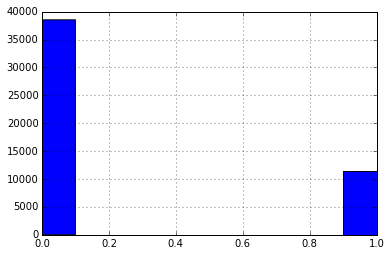

In [32]:
target.hist()

In [229]:
from sklearn.metrics import f1_score
print 'f1 score:', f1_score(y_test, pred)

f1 score: 0.372699743769


In [58]:
from sklearn.metrics import average_precision_score
average_precision_score(y_test, pred) 

0.52623275816294579

In [59]:
from sklearn.metrics import confusion_matrix
confusion_matrix(y_test, pred)

array([[9045,  428],
       [2302,  725]])

### 4. Draw ROC Curve

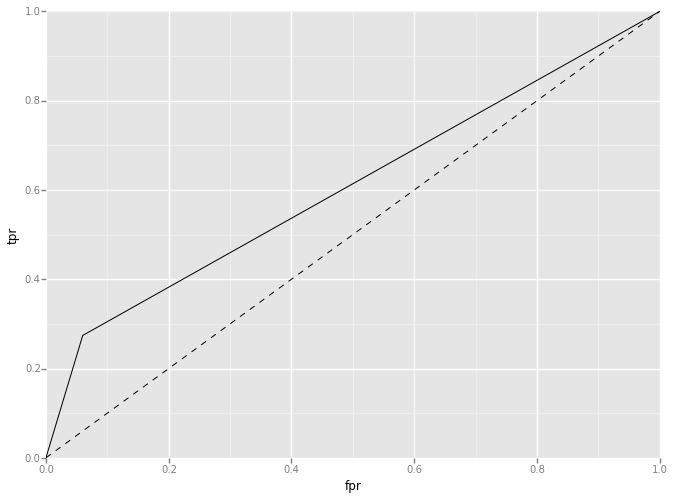

<ggplot: (293044949)>

In [230]:
from ggplot import *
from sklearn import metrics

fpr, tpr, _ = metrics.roc_curve(y_test, pred)

df = pd.DataFrame(dict(fpr=fpr, tpr=tpr))
ggplot(df, aes(x='fpr', y='tpr')) +\
    geom_line() +\
    geom_abline(linetype='dashed')

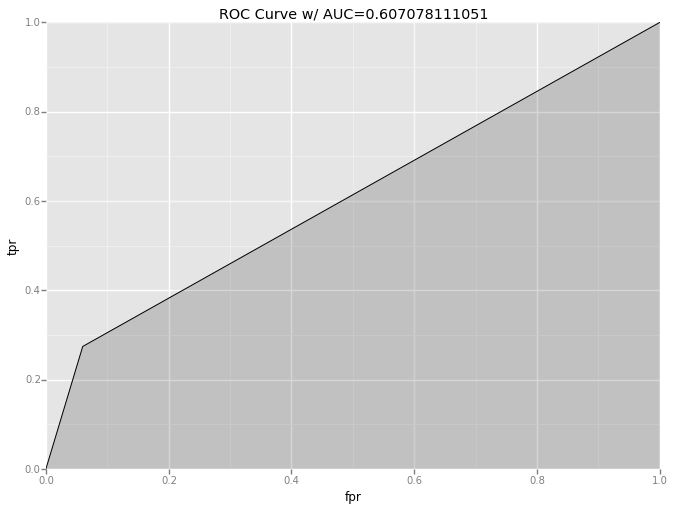

<ggplot: (315195417)>

In [231]:
auc = metrics.auc(fpr,tpr)
ggplot(df, aes(x='fpr', ymin=0, ymax='tpr')) +\
    geom_area(alpha=0.2) +\
    geom_line(aes(y='tpr')) +\
    ggtitle("ROC Curve w/ AUC=%s" % str(auc))

### Try Recursive Feature Elimination (RFE) method which is a feature selection approach 

### 5. Try Decision Tree

In [25]:
from sklearn import tree

clf_tree = tree.DecisionTreeClassifier(min_samples_split=40)
clf_tree.fit(X_train_pca, y_train)
pred = clf_tree.predict(X_test_pca)

In [28]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score

print 'Accuracy of the Decision Tree Model:', accuracy_score(y_test, pred)
print 'f1 score:', f1_score(y_test, pred)

Accuracy of the Decision Tree Model: 0.66424
f1 score: 0.312079986887


### 6. Try Naive Bayes

In [30]:
from sklearn.naive_bayes import GaussianNB

gnb = GaussianNB()
gnb.fit(X_train_pca, y_train)
pred = gnb.predict(X_test_pca)

print 'Accuracy of the Naive Bayes Model:', accuracy_score(y_test, pred)
print 'f1 score:', f1_score(y_test, pred)

Accuracy of the Naive Bayes Model: 0.64944
f1 score: 0.372026368587


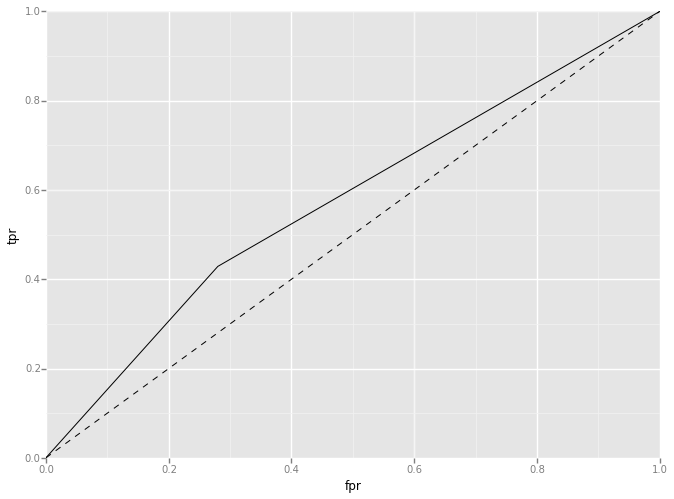

<ggplot: (371620025)>

In [31]:
from ggplot import *
from sklearn import metrics

fpr, tpr, _ = metrics.roc_curve(y_test, pred)

df = pd.DataFrame(dict(fpr=fpr, tpr=tpr))
ggplot(df, aes(x='fpr', y='tpr')) +\
    geom_line() +\
    geom_abline(linetype='dashed')

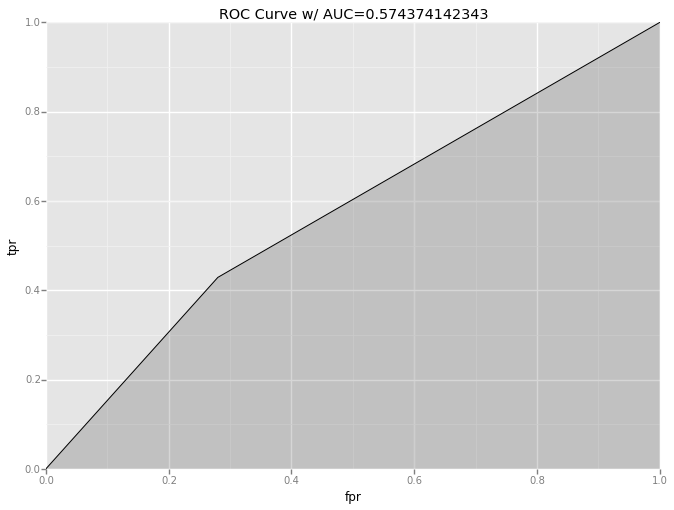

<ggplot: (401744857)>

In [32]:
auc = metrics.auc(fpr,tpr)
ggplot(df, aes(x='fpr', ymin=0, ymax='tpr')) +\
    geom_area(alpha=0.2) +\
    geom_line(aes(y='tpr')) +\
    ggtitle("ROC Curve w/ AUC=%s" % str(auc))

### 7. Try kNN Model

In [33]:
from sklearn.neighbors import KNeighborsClassifier

neigh = KNeighborsClassifier()
neigh.fit(X_train_pca, y_train)
pred = neigh.predict(X_test_pca)

In [34]:
print 'Accuracy of the kNN Model:', accuracy_score(y_test, pred)
print 'f1 score:', f1_score(y_test, pred)

Accuracy of the Naive Bayes Model: 0.7552
f1 score: 0.0989399293286


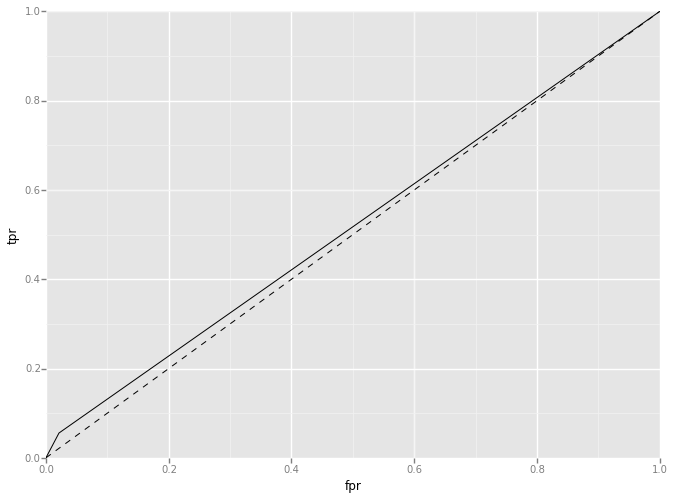

<ggplot: (315438993)>

In [35]:
from ggplot import *
from sklearn import metrics

fpr, tpr, _ = metrics.roc_curve(y_test, pred)

df = pd.DataFrame(dict(fpr=fpr, tpr=tpr))
ggplot(df, aes(x='fpr', y='tpr')) +\
    geom_line() +\
    geom_abline(linetype='dashed')

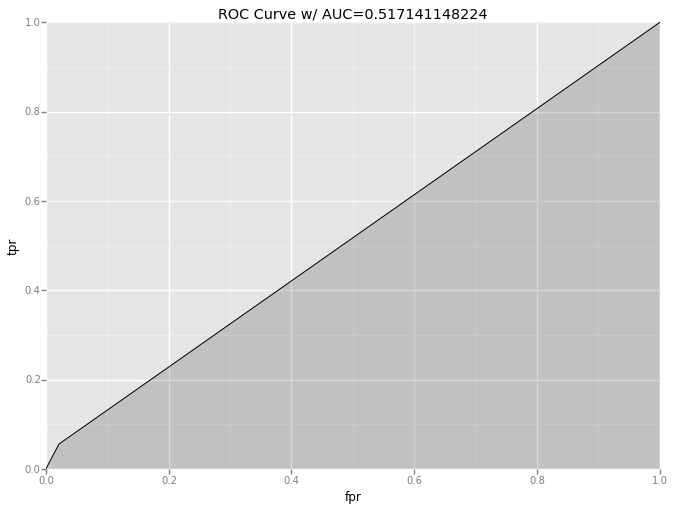

<ggplot: (315438869)>

In [36]:
auc = metrics.auc(fpr,tpr)
ggplot(df, aes(x='fpr', ymin=0, ymax='tpr')) +\
    geom_area(alpha=0.2) +\
    geom_line(aes(y='tpr')) +\
    ggtitle("ROC Curve w/ AUC=%s" % str(auc))

### 8. Try AdaBoostClassifier

In [50]:
from sklearn.ensemble import AdaBoostClassifier

adb = AdaBoostClassifier()
adb.fit(X_train_pca, y_train)
pred = adb.predict(X_test_pca)

In [51]:
print 'Accuracy of the AdaBoostClassifier:', accuracy_score(y_test, pred)
print 'f1 score:', f1_score(y_test, pred)

Accuracy of the AdaBoostClassifier: 0.76088
f1 score: 0.216102806189


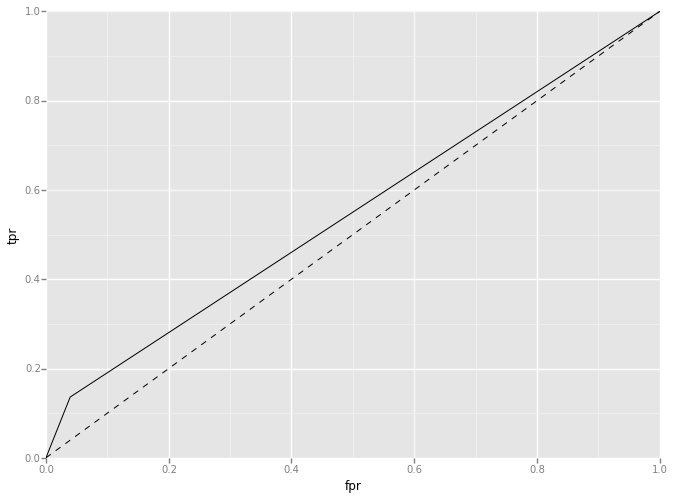

<ggplot: (401979489)>

In [52]:
from ggplot import *
from sklearn import metrics

fpr, tpr, _ = metrics.roc_curve(y_test, pred)

df = pd.DataFrame(dict(fpr=fpr, tpr=tpr))
ggplot(df, aes(x='fpr', y='tpr')) +\
    geom_line() +\
    geom_abline(linetype='dashed')

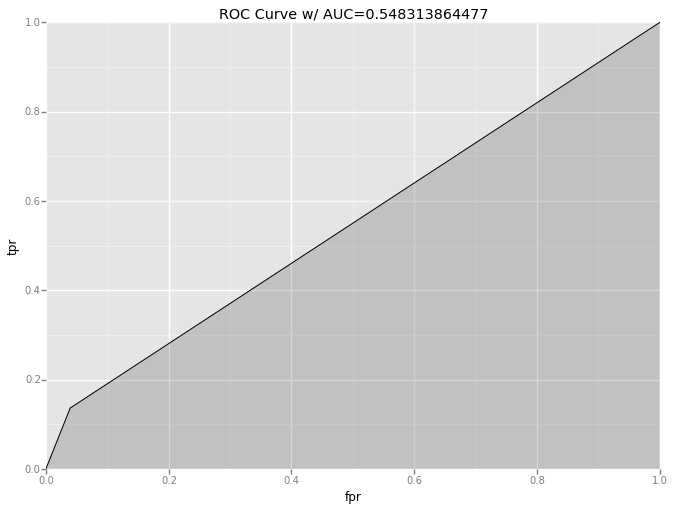

<ggplot: (379078297)>

In [53]:
auc = metrics.auc(fpr,tpr)
ggplot(df, aes(x='fpr', ymin=0, ymax='tpr')) +\
    geom_area(alpha=0.2) +\
    geom_line(aes(y='tpr')) +\
    ggtitle("ROC Curve w/ AUC=%s" % str(auc))